In [54]:
import pandas as pd
import numpy as np
import scipy.stats as ss
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
import sklearn
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

### EDA и Feature Engineering

In [55]:
data=pd.read_csv('housing_price.csv',encoding='ansi')
data

C:\Users\Admin\AppData\Local\Temp\ipykernel_5628\2711942719.py:2: DtypeWarning: Columns (1,11,12,14) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv('housing_price.csv',encoding='ansi')


,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,square,livingRoom,drawingRoom,kitchen,bathRoom,floor,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,131.00,2,1,1,1,ёЯ 26,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,132.38,2,2,1,2,ёЯ 22,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,198.00,3,2,1,3,ЦР 4,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,134.00,3,1,1,1,µЧ 21,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,81.00,2,1,1,1,ЦР 6,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,https://bj.lianjia.com/chengjiao/BJYZ92311192....,BJYZ92311192,116.546899,39.755236,1111027377053,2016-06-10,1.0,8,350.0,20580,170.07,3,2,1,2,ЦР 5,4.0,2003,1,6,0.333,0.0,1.0,0.0,3,36545.0
318847,https://bj.lianjia.com/chengjiao/BJYZ92320171....,BJYZ92320171,116.497474,39.810115,1111027377957,2016-06-10,NaN,1,108.8,31006,35.09,1,0,1,1,ЦР 24,1.0,2009,1,6,0.222,1.0,0.0,1.0,3,54282.0
318848,https://bj.lianjia.com/chengjiao/BJYZ92324217....,BJYZ92324217,116.497256,39.804081,1111027380056,2016-06-05,1.0,2,359.0,35138,102.17,2,2,1,2,ЦР 7,4.0,2000,3,6,0.500,1.0,1.0,0.0,3,46927.0
318849,https://bj.lianjia.com/chengjiao/BJYZ92333313....,BJYZ92333313,116.501794,39.799347,1111027377054,2016-06-12,NaN,4,720.0,40373,178.34,4,2,1,2,ЦР 5,4.0,2003,4,2,0.500,0.0,1.0,0.0,3,54842.0


Удаляем дублирующиеся строки 

In [56]:
data=data.drop_duplicates()
data.shape


(318851, 26)

Видим,что дубликатов в данных нет

In [57]:
data.columns

Index(['url', 'id', 'Lng', 'Lat', 'Cid', 'tradeTime', 'DOM', 'followers',
       'totalPrice', 'price', 'square', 'livingRoom', 'drawingRoom', 'kitchen',
       'bathRoom', 'floor', 'buildingType', 'constructionTime',
       'renovationCondition', 'buildingStructure', 'ladderRatio', 'elevator',
       'fiveYearsProperty', 'subway', 'district', 'communityAverage'],
      dtype='object')

In [58]:
pd.set_option("display.max.columns",None)
data.head()

,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,square,livingRoom,drawingRoom,kitchen,bathRoom,floor,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,131.00,2,1,1,1,ёЯ 26,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,132.38,2,2,1,2,ёЯ 22,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,198.00,3,2,1,3,ЦР 4,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,134.00,3,1,1,1,µЧ 21,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,81.00,2,1,1,1,ЦР 6,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0


Определим переменные с пропущенными значениями и обработаем пропуски 

In [59]:
data.isna().any()

url                    False
id                     False
Lng                    False
Lat                    False
Cid                    False
tradeTime              False
DOM                     True
followers              False
totalPrice             False
price                  False
square                 False
livingRoom             False
drawingRoom            False
kitchen                False
bathRoom               False
floor                  False
buildingType            True
constructionTime       False
renovationCondition    False
buildingStructure      False
ladderRatio            False
elevator                True
fiveYearsProperty       True
subway                  True
district               False
communityAverage        True
dtype: bool

Видим, в каких столбцах есть пропуски

In [60]:
for i in data:
    if data[i].isnull().sum()>0:
        data[i]=data[i].fillna(0)

In [61]:
data.isna().any()

url                    False
id                     False
Lng                    False
Lat                    False
Cid                    False
tradeTime              False
DOM                    False
followers              False
totalPrice             False
price                  False
square                 False
livingRoom             False
drawingRoom            False
kitchen                False
bathRoom               False
floor                  False
buildingType           False
constructionTime       False
renovationCondition    False
buildingStructure      False
ladderRatio            False
elevator               False
fiveYearsProperty      False
subway                 False
district               False
communityAverage       False
dtype: bool

In [81]:
data1=data.head(10000)
data1

,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,square,livingRoom,drawingRoom,kitchen,bathRoom,floor,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,131.00,2,1,1,1,ёЯ 26,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,132.38,2,2,1,2,ёЯ 22,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,198.00,3,2,1,3,ЦР 4,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,134.00,3,1,1,1,µЧ 21,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,81.00,2,1,1,1,ЦР 6,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,https://bj.lianjia.com/chengjiao/101092292781....,101092292781,116.373014,39.859478,1111027374270,2016-08-29,92.0,48,285.0,43962,64.83,2,1,1,1,¶Ґ 18,1.0,1998,3,6,0.250,1.0,1.0,1.0,2,59797.0
9996,https://bj.lianjia.com/chengjiao/101092292797....,101092292797,116.374708,39.854229,1111027377509,2016-07-18,50.0,12,199.0,44351,44.87,1,1,1,1,ЦР 6,4.0,1998,3,2,0.333,0.0,0.0,1.0,2,56242.0
9997,https://bj.lianjia.com/chengjiao/101092292798....,101092292798,116.425063,40.044097,1111027378336,2016-08-08,70.0,26,285.0,44967,63.38,2,2,1,2,µН 13,3.0,2011,4,6,0.182,1.0,0.0,1.0,7,52870.0
9998,https://bj.lianjia.com/chengjiao/101092292943....,101092292943,116.509448,39.874885,1111027375889,2016-06-26,27.0,4,590.0,48777,120.96,2,1,1,1,ЦР 32,3.0,2015,1,6,0.667,1.0,0.0,1.0,7,66300.0


Построим профиль данных

In [63]:
from pandas_profiling import ProfileReport
profile = ProfileReport(data1, title="Pandas Profiling Report")
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Видим высокую кореляцию

In [64]:
data1.describe().T

,count,mean,std,min,25%,50%,75%,max
Lng,10000.0,1.164100e+02,1.075766e-01,1.160725e+02,1.163437e+02,1.164191e+02,1.164719e+02,1.167324e+02
Lat,10000.0,3.995342e+01,9.579209e-02,3.962703e+01,3.989596e+01,3.993901e+01,4.000581e+01,4.025134e+01
Cid,10000.0,1.111029e+12,5.678991e+06,1.111027e+12,1.111027e+12,1.111027e+12,1.111027e+12,1.111101e+12
DOM,10000.0,1.265435e+02,9.180010e+01,1.700000e+01,7.200000e+01,1.060000e+02,1.480000e+02,1.464000e+03
followers,10000.0,4.769960e+01,5.110524e+01,0.000000e+00,1.800000e+01,3.300000e+01,5.900000e+01,1.000000e+03
totalPrice,10000.0,4.600164e+02,2.977851e+02,2.740000e+01,2.750000e+02,3.880000e+02,5.500000e+02,4.100000e+03
price,10000.0,5.291649e+04,2.244533e+04,9.841000e+03,3.566400e+04,4.847350e+04,6.699525e+04,1.478270e+05
square,10000.0,9.037934e+01,4.711340e+01,1.370000e+01,5.920000e+01,7.800000e+01,1.067500e+02,4.956500e+02
kitchen,10000.0,9.935000e-01,1.259339e-01,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00
buildingType,10000.0,2.925300e+00,1.315254e+00,0.000000e+00,1.000000e+00,4.000000e+00,4.000000e+00,4.000000e+00


Построим визуализации, логичные для набора данных

<function matplotlib.pyplot.show(close=None, block=None)>

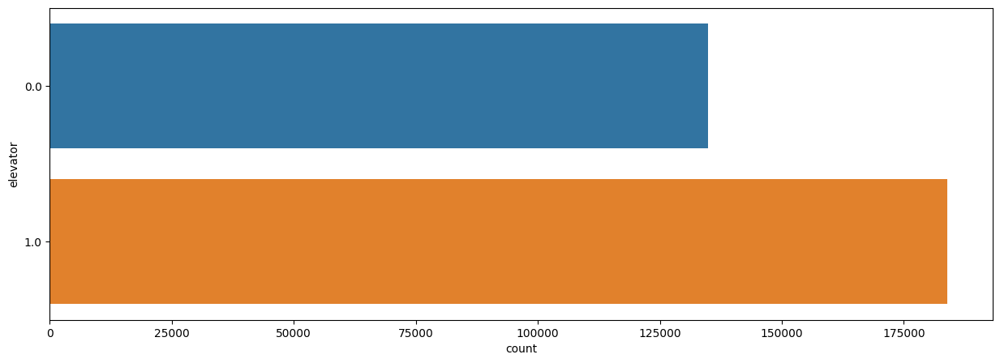

In [73]:
plt.figure(1,figsize=(15,5))
sns.countplot(y='elevator',data=data)
plt.show

На графике видим, что в большинстве домах, где продают квартиры есть лифты

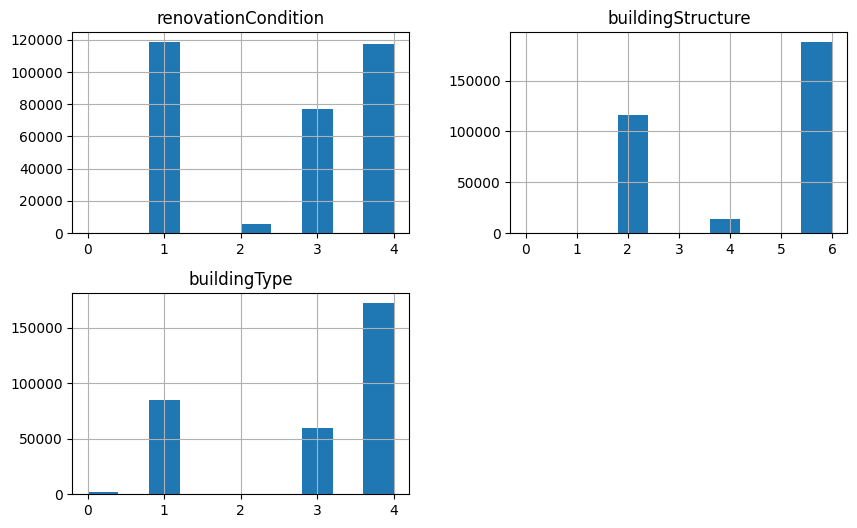

In [74]:
data2=data[["renovationCondition","buildingStructure","buildingType"]]
data2.hist(figsize=(10, 6))
plt.show()

На диаграмме мы видим тип здания, ремонтные условия и строительная конструция. Тип здания: включая башню (1), бунгало (2), сочетание плиты и башни (3), плиты ( 4).Ремонтные условия: включая другие ( 1 ), грубые ( 2), Простые ( 3), в твердом переплете ( 4 ).Строительная конструкция: в том числе неизвестная (1), смешанная (2), кирпичная и деревянная (3), кирпичная и бетонная (4), стальная (5) и железобетонная композитная (6).

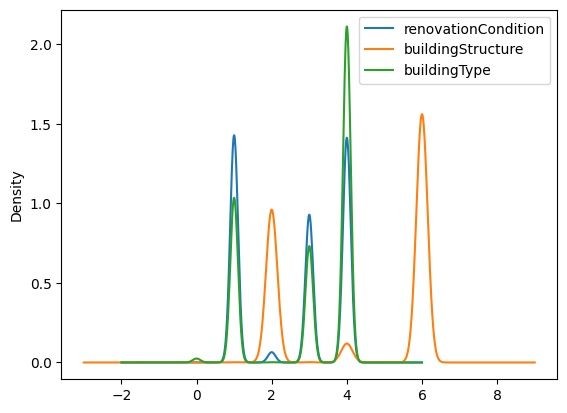

In [75]:
data2.plot(kind='kde')
plt.show()

Feature Engineering (FE)

In [82]:
#q = data1["url"].quantile(0.99)
q2 = data1["id"].quantile(0.99)
q3 = data1["Lng"].quantile(0.99)
q4 = data1["Lat"].quantile(0.99)
q5 = data1["Cid"].quantile(0.99)
#q6 = data1["tradeTime"].quantile(0.99)
q7 = data1["DOM"].quantile(0.99)
q8 = data1["followers"].quantile(0.99)
q9 = data1["totalPrice"].quantile(0.99)
q10 = data1["price"].quantile(0.99)
q11 = data1["square"].quantile(0.99)
q12 = data1["livingRoom"].quantile(0.99)
q13 = data1["drawingRoom"].quantile(0.99)
q14 = data1["kitchen"].quantile(0.99)
q15 = data1["bathRoom"].quantile(0.99)
#q16 = data["floor"].quantile(0.99)
q17 = data1["buildingType"].quantile(0.99)
#q18 = data["constructionTime"].quantile(0.99)
q19 = data1["renovationCondition"].quantile(0.99)
q20 = data1["buildingStructure"].quantile(0.99)
q21 = data1["ladderRatio"].quantile(0.99)
q22 = data1["elevator"].quantile(0.99)
q23 = data1["fiveYearsProperty"].quantile(0.99)
q24 = data1["subway"].quantile(0.99)
q25 = data1["district"].quantile(0.99)
q26 = data1["communityAverage"].quantile(0.99)

#data1[data["url"] < q]
data1[data1["id"] < q2]
data1[data1["Lng"] < q3]
data1[data1["Lat"] < q4]
data1[data1["Cid"] < q5]
#data1[data["tradeTime"] < q6]
data1[data1["DOM"] < q7]
data1[data1["followers"] < q8]
data1[data1["totalPrice"] < q9]
data1[data1["price"] < q10]
data1[data1["square"] < q11]
data1[data1["livingRoom"] < q12]
data1[data1["drawingRoom"] < q13]
data1[data1["kitchen"] < q14]
data1[data1["bathRoom"] < q15]
#data1[data["floor"] < q16]
data1[data1["buildingType"] < q17]
#data1[data["constructionTime"] < q18]
data1[data1["renovationCondition"] < q19]
data1[data1["buildingStructure"] < q20]
data1[data1["ladderRatio"] < q21]
data1[data1["elevator"] < q22]
data1[data1["fiveYearsProperty"] < q23]
data1[data1["subway"] < q24]
data1[data1["district"] < q25]
data1[data1["communityAverage"] < q26]


,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,square,livingRoom,drawingRoom,kitchen,bathRoom,floor,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,131.00,2,1,1,1,ёЯ 26,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,132.38,2,2,1,2,ёЯ 22,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,198.00,3,2,1,3,ЦР 4,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,134.00,3,1,1,1,µЧ 21,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,81.00,2,1,1,1,ЦР 6,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,https://bj.lianjia.com/chengjiao/101092292781....,101092292781,116.373014,39.859478,1111027374270,2016-08-29,92.0,48,285.0,43962,64.83,2,1,1,1,¶Ґ 18,1.0,1998,3,6,0.250,1.0,1.0,1.0,2,59797.0
9996,https://bj.lianjia.com/chengjiao/101092292797....,101092292797,116.374708,39.854229,1111027377509,2016-07-18,50.0,12,199.0,44351,44.87,1,1,1,1,ЦР 6,4.0,1998,3,2,0.333,0.0,0.0,1.0,2,56242.0
9997,https://bj.lianjia.com/chengjiao/101092292798....,101092292798,116.425063,40.044097,1111027378336,2016-08-08,70.0,26,285.0,44967,63.38,2,2,1,2,µН 13,3.0,2011,4,6,0.182,1.0,0.0,1.0,7,52870.0
9998,https://bj.lianjia.com/chengjiao/101092292943....,101092292943,116.509448,39.874885,1111027375889,2016-06-26,27.0,4,590.0,48777,120.96,2,1,1,1,ЦР 32,3.0,2015,1,6,0.667,1.0,0.0,1.0,7,66300.0


In [83]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

X = data1[[ 'id', 'Lng', 'Lat', 'Cid', 'DOM', 'followers',
       'totalPrice', 'price', 'square', 'livingRoom', 'drawingRoom', 'kitchen',
       'bathRoom', 'buildingType','renovationCondition', 'buildingStructure', 'ladderRatio', 'elevator',
       'fiveYearsProperty', 'subway', 'district', 'communityAverage']]
y = data1.iloc[:, -1]

bestfeatures = SelectKBest(score_func = chi2, k = 'all')
fit = bestfeatures.fit(X, y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfcolumns, dfscores], axis = 1)
featureScores.columns = ['Specs', 'Score']  
print(featureScores.nlargest(10, 'Score'))  

                Specs         Score
7               price  8.900940e+07
21   communityAverage  8.833351e+07
6          totalPrice  1.523051e+06
3                 Cid  2.858057e+05
4                 DOM  2.372056e+05
5           followers  1.920283e+05
8              square  1.675732e+05
20           district  1.124245e+04
0                  id  9.836157e+03
15  buildingStructure  5.866082e+03
